In [1]:
import numpy as np
import plotly.express as px
import pandas as pd

import sys
import os
sys.path.append(os.path.dirname(os.path.dirname(os.getcwd())))

from sandwich_numerical.sandwich import Sandwich

## Assemble 2 meshes. $\mu = 1$ in one mesh and $\mu = 1000$ in another one

In [2]:
block_height = 21
mesh_height = block_height * 3
block_size = (block_height, 3000)
grid_step = 0.005
mu_1 = 1
mu_2 = 1000

base_grad_vec = np.sin((2 * np.pi) / (mesh_height-1) * np.arange(mesh_height))

grad_vec_1 = np.copy(base_grad_vec)
mesh_1 = Sandwich(
    block_size,
    grad_vec_1,
    grid_step,
    mu_1
)

grad_vec_1000 = np.copy(base_grad_vec)
# grad_vec_1000[block_size[0]:2*block_size[0]] *= mu_2
mesh_1000 = Sandwich(
    block_size,
    grad_vec_1000,
    grid_step,
    mu_2
)

Run 10_000 iterations on each mesh

In [3]:
def process_mesh(mesh, iter_count):
    residuals = []
    for i in range(iter_count):
        mesh.step()
        if i % 100_000 == 0:
            print(i)
            residuals.append((i, mesh.get_residual()))
            
    return residuals

In [4]:
iter_count = 10_000

residuals_1 = process_mesh(mesh_1, iter_count)
residuals_1000 = process_mesh(mesh_1000, iter_count)

0
0


Analyze the distributions of displacements

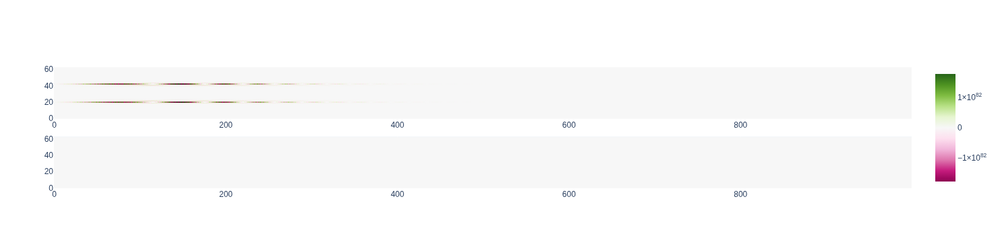

In [5]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1)
fig.add_trace(px.imshow(mesh_1.get_displacement_array()[:, :1000]).data[0], row=1, col=1)
fig.add_trace(px.imshow(mesh_1000.get_displacement_array()[:, :1000]).data[0], row=2, col=1)

fig.update_layout()
fig.show()

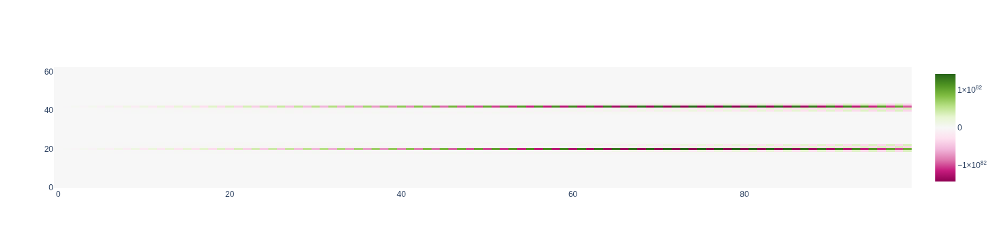

In [6]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(px.imshow(mesh_1.get_displacement_array()[:, :100]).data[0], row=1, col=1)

fig.update_layout()
fig.show()

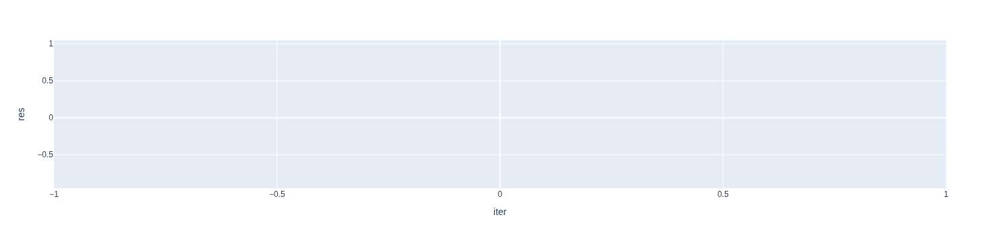

In [7]:
px.line(pd.DataFrame(residuals_1000, columns=['iter', 'res']), x='iter', y='res')

# Let's look at the cros section displacement distribution

In [8]:
def get_samples_df(mesh):
    displacement_data = mesh.get_displacement_array()
    
    sample_size = displacement_data.shape[0]
    return pd.DataFrame({
        'x2': np.arange(mesh_height) * grid_step,
        'x1=0.0': displacement_data[:, 0],
        'x1=0.2': displacement_data[:, 40],
        'x1=0.4': displacement_data[:, 80],
        'x1=1.0': displacement_data[:, 200]
    })

def plot_samples_data(mesh):
    df = get_samples_df(mesh)
    return px.line(df, x='x2', y=['x1=0.0', 'x1=0.2', 'x1=0.4', 'x1=1.0'])

### $\mu=1$

In [9]:
plot_samples_data(mesh_1)

### $\mu=1000$

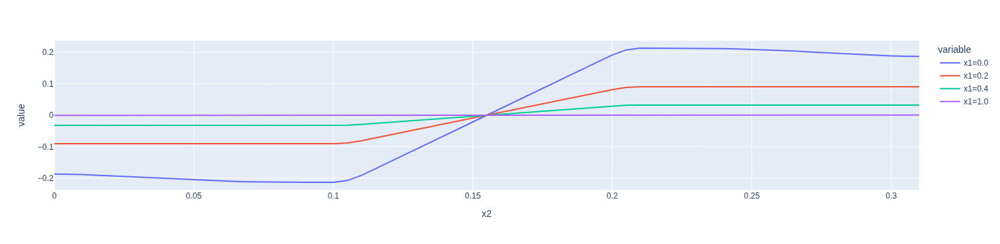

In [10]:
plot_samples_data(mesh_1000)

In [11]:
def displacement_data_to_df(mesh):
    displacement_data = mesh.get_displacement_array()
    result_dict = {
        'x2_mesh_id': np.arange(mesh_height),
        'x2_bottom': np.arange(mesh_height) * grid_step,
        'x2_top': np.arange(mesh_height)
    }
    result_dict['x2_bottom'] = result_dict['x2_mesh_id'] * grid_step
    result_dict['x2_top'] = result_dict['x2_bottom'] + grid_step
    
    for i in range(displacement_data.shape[1]):
        result_dict['x1=%.4f' % (i * grid_step)] = displacement_data[:, i]
        
    return pd.DataFrame(result_dict)

In [12]:
displacement_data_to_df(mesh_1).to_csv('/tmp/displacement_mu_1.csv', index=False)
displacement_data_to_df(mesh_1000).to_csv('/tmp/displacement_mu_1000.csv', index=False)

In [13]:
displacement_data_to_df(mesh_1)

,x2_mesh_id,x2_bottom,x2_top,x1=0.0000,x1=0.0050,x1=0.0100,x1=0.0150,x1=0.0200,x1=0.0250,x1=0.0300,...,x1=14.9500,x1=14.9550,x1=14.9600,x1=14.9650,x1=14.9700,x1=14.9750,x1=14.9800,x1=14.9850,x1=14.9900,x1=14.9950
0,0,0.000,0.005,2.722278e+67,3.133845e+66,-3.345995e+67,6.372430e+67,-9.389522e+67,1.239414e+68,-1.538309e+68,...,6.431499e-130,-2.112197e-129,7.772734e-130,4.103713e-130,-4.844439e-130,8.246940e-131,1.328879e-130,-9.132943e-131,1.065570e-131,0.0
1,1,0.005,0.010,3.133845e+66,-2.844102e+67,5.374631e+67,-7.907787e+67,1.044641e+68,-1.299330e+68,1.555124e+68,...,4.009729e-129,-9.184726e-130,-1.051996e-129,8.477160e-130,-1.334187e-131,-3.123202e-130,1.519748e-130,5.689274e-131,-9.405149e-131,0.0
2,2,0.010,0.015,-1.347497e+68,-6.968015e+67,2.739492e+68,-4.779482e+68,6.815678e+68,-8.846976e+68,1.087227e+69,...,5.535758e-129,8.599726e-129,-6.203980e-129,-2.070813e-130,2.403808e-129,-1.097376e-129,-3.349178e-130,5.831753e-130,-2.593327e-130,0.0
3,3,0.015,0.020,-5.514057e+68,4.588130e+68,-3.667364e+68,2.762620e+68,-1.884736e+68,1.044534e+68,-2.528053e+67,...,-5.735836e-128,4.068796e-128,1.772048e-129,-1.596229e-128,6.954616e-129,2.600823e-129,-3.691460e-129,5.972695e-130,9.805616e-130,0.0
4,4,0.020,0.025,8.677605e+68,3.229954e+69,-7.326101e+69,1.142237e+70,-1.552043e+70,1.962192e+70,-2.372848e+70,...,-2.667124e-127,-1.533041e-128,1.067181e-127,-4.569022e-128,-1.784384e-128,2.589791e-128,-5.885160e-129,-7.674154e-129,7.242362e-129,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,58,0.290,0.295,-8.677605e+68,-3.229954e+69,7.326101e+69,-1.142237e+70,1.552043e+70,-1.962192e+70,2.372848e+70,...,2.667124e-127,1.533041e-128,-1.067181e-127,4.569022e-128,1.784384e-128,-2.589791e-128,5.885160e-129,7.674154e-129,-7.242362e-129,0.0
59,59,0.295,0.300,5.514057e+68,-4.588130e+68,3.667364e+68,-2.762620e+68,1.884737e+68,-1.044534e+68,2.528059e+67,...,5.735836e-128,-4.068796e-128,-1.772048e-129,1.596229e-128,-6.954616e-129,-2.600823e-129,3.691460e-129,-5.972695e-130,-9.805616e-130,0.0
60,60,0.300,0.305,1.347497e+68,6.968016e+67,-2.739492e+68,4.779482e+68,-6.815678e+68,8.846977e+68,-1.087227e+69,...,-5.535758e-129,-8.599726e-129,6.203980e-129,2.070813e-130,-2.403808e-129,1.097376e-129,3.349178e-130,-5.831753e-130,2.593327e-130,0.0
61,61,0.305,0.310,-3.133837e+66,2.844101e+67,-5.374630e+67,7.907786e+67,-1.044641e+68,1.299330e+68,-1.555124e+68,...,-4.009729e-129,9.184726e-130,1.051996e-129,-8.477160e-130,1.334187e-131,3.123202e-130,-1.519748e-130,-5.689274e-131,9.405149e-131,0.0
